# <center>Proyecto 2, Etapa 1</center>
<hr>

## <center>Autor
<center>Randall Leon Madriz</center>

## <center>Curso
<center>Señales y Sistemas 1</center>

## <center>Profesor
<center>Marvin Coto Jiménez</center>


# Introduccion
En este cuaderno de Jupyter, obtendrás código e información para el procesamiento y filtrado de muestras de audio que contienen diferentes tipos de ruido. El objetivo es eliminar el ruido presente en tres muestras de audio, utilizando las herramientas vistas en el curso de Señales y Sistemas 1, como por ejemplo el uso de la transformada de Fourier. De esta manera, podrás obtener el espectro de frecuencias de los audios y realizar un análisis frecuencial detallado. Además, implemetara filtros para la eliminación del ruido. Esto se logrará utilizando el lenguaje de programación Python y sus librerías para el análisis de señales.

**Contextualización del problema**

El problema se realizará mediante etapas, las cuales son las siguientes:

1. **Obtener el espectro de las muestras de audio:** Analizaremos las características espectrales de las muestras de audio.

2. **Obtener el fragmento inicial o final del ruido:** Utilizaremos el software Audacity para seleccionar y extraer el fragmento inicial o final de la grabación que contiene solo el ruido.

3. **Determinar las frecuencias presentes en las señales de ruido:** Mediante la observación de los espectros del ruido, identificaremos las frecuencias presentes.

4. **Implementar filtros para eliminar el ruido:** Utilizaremos implementaciones de filtros en Python, basadas con los datos obtenidos de las etapas anterior.

## Muestras de audio:
Las muestras de audio que utilizaremos son las siguientes:

- `muestra1.wav`
- `muestra2.wav`
- `muestra3.wav`



# Resultados

## 1. **Obtener el espectro de las muestras de audio:**

Se utilizara el codigo desarrollado en el Proyecto 1. Que nos permite obtener su espectro utilizando técnicas de procesamiento de señales.

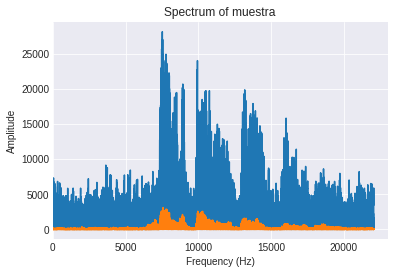

In [27]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
plt.style.use('seaborn-dark')

sample_rate, middle_c = wavfile.read('muestra1.wav') # cargar los datos del archivo de audio

#calcular la transformada de Fourier del archivo de audio
t = np.arange(middle_c.shape[0])
freq = np.fft.fftfreq(t.shape[-1])*sample_rate
sp = np.fft.fft(middle_c) 

# Graficar el espectro
plt.plot(freq, abs(sp.real))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Spectrum of muestra')
plt.xlim((0, 23000))
plt.grid()

# Mostrar
plt.show()

Anteriormente se observó el espectro de la muestra 1. Los picos bien definidos significan las diferentes frecuencias presentes en el audio. En el eje horizontal se observan los valores de la frecuencia y en el vertical la magnitud.

EL codigo lee el archivo de audio llamado "muestra1_inicio.wav" y almacena la frecuencia de muestreo del audio en la variable sample_rate y los datos de la señal de audio en la variable middle_c.

Le realiza la transformada de Fourier a middle_c y grafica el espectro.


A continuacion abjunta el espectro de la muestra 2 y 3.

<center>Espectro de la muestra2</center>

![Espectro de la muestra2:](muestra2.png)



<center>Espectro de la muestra3</center>

![Espectro de la muestra3:](muestra3.png)


## 2. Obtener el fragmento inicial o final del ruido

Para la instalación de Audacity, se debe ejecutar el siguiente comando:

```bash
sudo apt install audacity



Para cargar un archivo en Audacity, se debe dar clic en "File", luego en "Open" y se selecciona el archivo que se desea abrir, como se muestra a continuación:

![Espectro de la muestra2:](cargar_audio.png)

Para seleccionar la parte que se desea, en este caso donde predomina el ruido, se debe dar clic en el símbolo "I" y luego solo seleccionar la parte deseada, como se muestra a continuación:
![s](selecionar.png)

Para exportar la parte seleccionada, se debe dar clic en "File", luego en "Export" y seleccionar el formato:
![s](exportar.png)


Se vuelve a utilizar el código anterior para poder observar el espectro de las muestras donde está presente solo el ruido. Los resultados fueron: 

Muestra1: 
![s](exportar.png)

## **Determinar las frecuencias presentes en las señales de ruido:**

EL espectro obtenido de del sonido de la muestra  se observa acontinuacion, el espectro se obtuve utilizando el condigo anterio. 

<center>Espectro del sonido de la muestra 1</center>

En la muestra 1, las frecuencias del sonido se ven muy presentes en casi todo el espectro. Con la ayuda de Audacity, se pudo observar que el sonido está muy presente en todo el audio. Por lo tanto, es muy difícil eliminarlo y obtener solo la voz.

![s](inicio.png)

<center>Espectro del sonido de la muestra 2</center>

![s](inicio2.png)


Se observa que el sonido de la muestra 2 tiene componentes a partir de 1000 Hz aproximadamente. Por lo tanto, en esa muestra es útil obtener un filtro pasa bandas de frecuencias bajas. Esto se comprobó con Audacity, ya que se observa que las frecuencias que genera la voz están presentes en las frecuencias bajas.

<center>Espectro del sonido de la muestra 3</center>

![s](inicio3.png)


El sonido tiene componentes a partir de 800 Hz aproximadamente. Esto se corroboró igualmente en Audacity.

##  **Implementar filtros para eliminar el ruido:**

Las muestras de sonido están almacenadas en un repositorio personal, lo que facilita la carga de los archivos de audio mediante URL. El código implementado se basa en un notebook de Google Colab: https://colab.research.google.com/github/timsainb/noisereduce/blob/master/notebooks/1.0-test-noise-reduction.ipynb

### Muestra3:


Para eliminar el ruido se generó el siguiente código. Contiene dos funciones:

    - Speak: Esta función es la encargada de retornar los valores del audio y su frecuencia de muestreo.
    - Play: Reproduce el audio.
    
Para esta muestra se creó un filtro pasa bajas, con una frecuencia de corte de 800Hz. Se puede reproducir el audio original y luego el audio filtrado para comprobar que el sonido ha sido eliminado en su mayor parte.


In [129]:
from io import BytesIO
import tempfile
import requests
import numpy as np
import scipy.signal as sg
import pydub
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from pydub import AudioSegment
from io import BytesIO
import soundfile as sf

def speak(data):
    with tempfile.NamedTemporaryFile(suffix=".mp3") as f:
        f.write(data)
        f.seek(0)
        
        audio, fr = sf.read(f.name)
        
    x = audio.T  
    x = x / np.abs(x).max()
    
    return x, fr
def play(x, fr, autoplay=False):
    display(Audio(x, rate=fr, autoplay=autoplay))

url = ('https://github.com/RanLeon99/audios_proyecto2/'
       'blob/main/muestra3.mp3?raw=true')
response = requests.get(url)
voice = response.content

print("Audio original: ")
x, fr = speak(voice)
play(x, fr)

#El código realiza un filtro Butterworth de paso bajo
b, a = sg.butter(4, 800. / (fr / 2.), 'low')
x_fil = sg.filtfilt(b, a, x)
print(" Audio luego del filtro: ")
play(x_fil, fr)


Audio original: 


 Audio luego del filtro: 


### Muestra 2


Se utiliza las dos funciones del codigo anterior, solamente que se carga la muestra2 y crea un filtro basa bandas, sus frecuencias de corte son las siguientes:

- Frecuencia de corte inferior : 300
- Frecuencia de corte superior " 700

In [126]:
url = ('https://github.com/RanLeon99/audios_proyecto2/'
       'blob/main/muestra2.mp3?raw=true')
response = requests.get(url)
voice = response.content

print("Audio original: ")
x, fr = speak(voice)
play(x, fr)

lowcut = 300  # Frecuencia de corte inferior
highcut = 700  # Frecuencia de corte superior
b, a = sg.butter(4, [lowcut / (fr / 2.), highcut / (fr / 2.)], 'bandpass')
x_fil = sg.filtfilt(b, a, x)
print("Audio luedo del filtro: ")
play(x_fil, fr)

Audio original: 


Audio luedo del filtro: 


### Muestra 1

Para esta muestra, también se creó un filtro pasa bandas. Se realizaron varias pruebas experimentales con diferentes filtros, pero no se logró eliminar completamente el sonido no deseado. Sin embargo, el siguiente código muestra uno de los mejores resultados obtenidos.

In [128]:
url = ('https://github.com/RanLeon99/audios_proyecto2/'
       'blob/main/muestra1.mp3?raw=true')
response = requests.get(url)
voice = response.content

print("Audio original: ")
x, fr = speak(voice)
play(x, fr)

lowcut = 400  # Frecuencia de corte inferior
highcut = 800  # Frecuencia de corte superior
b, a = sg.butter(4, [lowcut / (fr / 2.), highcut / (fr / 2.)], 'bandpass')
x_fil = sg.filtfilt(b, a, x)
print("Audio luego del filtro: ")
play(x_fil, fr)

Audio original: 


Audio luego del filtro: 


# Conclusiones

- Se logró realizar un análisis espectral de cada muestra utilizando las librerías de procesamiento de señales proporcionadas por Python. Esto permitió observar las frecuencias presentes en las muestras y obtener un mejor entendimiento de su contenido.


- Se observó el gran uso que se tiene con la transformada de Fourier para el análisis de señales, gracias a que se puede graficar el espectro.


- Se implementaron filtros en Python para poder eliminar el ruido de diferentes muestras. Esto es de suma importancia porque se pone en práctica los conocimientos adquiridos del curso de señales y sistemas 1 para resolver problemas de la vida real.